In [1]:
!pip install -q git+https://github.com/tensorflow/docs

You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


In [1]:
environment = os.environ.get('KAGGLE_KERNEL_RUN_TYPE', 'localhost')

In [56]:
# import libraries 
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns 
# %matplotlib inline
import math

from urllib.parse import urljoin
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder, PowerTransformer, QuantileTransformer
from sklearn.compose import ColumnTransformer, make_column_transformer, make_column_selector, TransformedTargetRegressor
from sklearn.impute import SimpleImputer, KNNImputer

# from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
# from sklearn.tree import DecisionTreeRegressor
# from sklearn.ensemble importGradientBoostingRegressor, VotingRegressor
# from sklearn.linear_model import LinearRegression
# from sklearn.svm import SVR, LinearSVR
from sklearn.model_selection import GridSearchCV, cross_validate, cross_val_score, cross_val_predict, train_test_split

import tensorflow as tf
import tensorflow_docs as tfdocs
import tensorflow_docs.plots
import tensorflow_docs.modeling
from tensorflow import keras
from tensorflow.keras import layers,regularizers

import pyreadr

# palabras a buscar en columna descripción
TEXT_MINING_KEYWORDS = ['balcon', 'cochera', 'sum', 'parrilla', 'pileta']

# BASE_URL_DATA = '/kaggle/input/prediccion-precio-propiedades-fmap-2020/'
BASE_URL_DATA = '/kaggle/input/prediccion-precio-propiedades-corregido/' if environment != 'localhost' else ''

def vectorize_descripcion(df: pd.DataFrame):
    
    # entrenamos el modelo para buscar las keywords
    vectorizer = CountVectorizer(binary=True, strip_accents='unicode')  
    vectorizer.fit(TEXT_MINING_KEYWORDS)

    # hot encoding de los resultados
    desc = vectorizer.transform(df['descripcion'])

    # crear dataframe con resultados
    df_desc = pd.DataFrame(data=desc.toarray(), columns=vectorizer.get_feature_names())
    return pd.concat([df.reset_index(drop=True), df_desc.reset_index(drop=True)], axis=1, sort=False)

def get_outliers(df: pd.DataFrame):
    return df[df_train['id'].isin(['7798', '31417', '10764', '12865', '22126', '49492'])]

def remove_outliers(df: pd.DataFrame):
    outliers = get_outliers(df)
    df.drop(outliers.index, inplace=True)

def preprocessing(df: pd.DataFrame, process_outliers = True):
    # nombres features en minuscula
    df.columns = map(str.lower, df.columns)

    df['barrio'] = df['barrio'].astype('category')
    df['cluster'] = df['cluster'].astype('category')
    df['id'] = df['id'].astype('int')
    
    # guardar los id
    ids = df['id']
    
    # eliminar outliers
    if process_outliers:
        remove_outliers(df)
    
    # text mining buscar keywords en descripcion
    df['descripcion'].fillna('', inplace=True)
    df = vectorize_descripcion(df)
    
    # eliminar columnas innecesarias del modelo
    df.drop([
        'banios',
        # 'barrio', 
        'subbarrio',
        'descripcion',
        'p_mt2', 
        'n_bancos',
        'n_barrios_p', 
        'n_bici', 
        'n_boliches', 
        'n_clinicas', 
        'n_comisarias',
        'n_embajadas', 
        'n_gasolina', 
        'n_gastronomica', 
        'n_homicidios',
        'n_hospitales', 
        'n_hurtos', 
        'n_hurtos_auto',
        'n_robo', 
        'n_robo_vehi',
        'n_subte_bocas', 
        'n_uni',
        'cluster',
        # 'terraza',
        'lujo',
        'sup_cubierta'
    ],axis=1, inplace=True, errors='raise')


    return ids, df.set_index('id')


def split_data(df: pd.DataFrame, test_size = 0.05):
    y = df[['precio']]
    X = df.drop(['precio'], axis=1)

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = test_size, random_state=5)
    return X_train, X_test, y_train, y_test


## Preprocesamiento de los features: imputación, estandarización, one-hot encoding
def make_transformer_pipeline():
    numeric_transformer = make_pipeline( 
        SimpleImputer(missing_values = np.nan, strategy='mean'),
        StandardScaler(),
    )

    categorical_transformer = make_pipeline(
        #SimpleImputer(strategy='constant', fill_value='missing'),
        #SimpleImputer(strategy="most_frequent"),
        #KNNImputer(n_neighbors=3, weights="uniform"),     # KNNImputer tarda una eternidad...
        OneHotEncoder(handle_unknown='ignore')
    )

    return make_column_transformer(
        (numeric_transformer, make_column_selector(dtype_include=['int64', 'float64'])),
        (categorical_transformer, make_column_selector(dtype_include=['category']))
    )    

def baseline_ada_model_pipeline():
    transformer = make_transformer_pipeline()
    ada = AdaBoostRegressor(random_state = 5)
    
    return make_pipeline(transformer, TransformedTargetRegressor(ada, func=np.log, inverse_func=np.exp))    

def create_train_ada_model():
    transformer = make_transformer_pipeline()

    model = Pipeline([
        ('preprocessing', transformer),
        ('model', TransformedTargetRegressor(AdaBoostRegressor(base_estimator=DecisionTreeRegressor(), loss='square', random_state=5), func=np.log, inverse_func=np.exp))
    ])
    return model

# # Crear modelo red neuronal Keras
# def build_1layer_keras_model(input_dim, n_neurons = 8):    
#     model = keras.Sequential()
#     model.add(layers.Dense(n_neurons, activation='relu', input_dim=input_dim))
#     model.add(layers.Dense(1))
#     model.compile(loss='mean_squared_error', optimizer='adam', metrics=[tf.keras.metrics.RootMeanSquaredError()])

#     return model

# Crear modelo red neuronal Keras
def build_dense_keras_model(input_dim, n_neurons = [8, 8]):
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)

    model = keras.Sequential()
    # model.add(layers.Dense(n_neurons_1, kernel_initializer='normal', activation='relu', input_dim=input_dim))
    # model.add(layers.Dense(n_neurons_2, kernel_initializer='normal', activation='relu'))
    for idx, n in enumerate(n_neurons):
        if idx==0:
            model.add(layers.Dense(n, activation='relu', input_dim=input_dim))
        else:
            model.add(layers.Dense(n, activation='relu'))
    model.add(layers.Dense(1, kernel_initializer='normal'))
    model.compile(loss='mean_squared_error', optimizer=optimizer, metrics=[tf.keras.metrics.RootMeanSquaredError()])

    return model

# # Pipeline preprocesamiento para red neuronal
# def create_keras_pipeline():
#     EPOCHS = 300
#     BATCH_SIZE = 32

#     transformer = make_transformer_pipeline()
#     pipeline = Pipeline([
#         ('preprocessing', transformer),
#         ('model', TransformedTargetRegressor(KerasRegressor(build_fn=build_1layer_keras_model, epochs=EPOCHS, batch_size=BATCH_SIZE, verbose=1), 
#         transformer=QuantileTransformer(output_distribution='normal', random_state=5)
#         ))
#     ])
#     return pipeline

# Graficar predicciones
def plot_test_predictions(y_test, y_pred):
    # graficar predicciones contra datos actuales
    fig, ax = plt.subplots(figsize = (18,10))
    ax.scatter(y_test, y_pred, edgecolors=(0, 0, 0))
    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=4)
    ax.set_xlabel('Precio test')
    ax.set_ylabel('Precio predicción')
    plt.show()

def read_rds(filename):
    result = pyreadr.read_r(filename)
    return result[None]

# Cargar datos entrenamiento

In [42]:
# df_train = pd.read_csv(urljoin(BASE_URL_DATA,'data_train_def.csv'))
df_train = read_rds('data_train_def.rds')

In [43]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20371 entries, 0 to 20370
Data columns (total 34 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              20371 non-null  object 
 1   lat             20371 non-null  float64
 2   lon             20371 non-null  float64
 3   precio          20371 non-null  float64
 4   BARRIO          20371 non-null  object 
 5   n_uni           20371 non-null  int32  
 6   n_boliches      20371 non-null  int32  
 7   n_clinicas      20371 non-null  int32  
 8   n_hospitales    20371 non-null  int32  
 9   sup_cubierta    20371 non-null  float64
 10  n_comisarias    20371 non-null  int32  
 11  n_embajadas     20371 non-null  int32  
 12  n_subte_bocas   20371 non-null  int32  
 13  n_barrios_p     20371 non-null  int32  
 14  n_bici          20371 non-null  int32  
 15  n_bancos        20371 non-null  int32  
 16  A_Estrenar      20371 non-null  float64
 17  banios          20371 non-null 

In [44]:
df_train.describe()

,lat,lon,precio,n_uni,n_boliches,n_clinicas,n_hospitales,sup_cubierta,n_comisarias,n_embajadas,...,n_hurtos,n_hurtos_auto,n_robo,dormitorios,n_robo_vehi,p_mt2,lujo,sup_total,habitaciones,terraza
count,20371.000000,20371.000000,2.037100e+04,20371.000000,20371.000000,20371.000000,20371.000000,20371.000000,20371.000000,20371.000000,...,20371.000000,20371.000000,20371.000000,20371.000000,20371.000000,20371.000000,20371.000000,20371.000000,20371.00000,20371.000000
mean,-34.598249,-58.440195,1.352987e+05,4.158706,4.099013,2.530460,0.690491,48.304693,1.218939,0.532080,...,312.300673,24.078592,398.034068,1.266261,4.940602,2863.588737,0.360463,48.306440,1.95631,0.300083
std,0.025411,0.036594,7.842911e+04,6.151475,5.276728,3.061518,1.012042,10.004436,0.900922,1.715158,...,261.213086,9.906815,249.341898,0.485115,5.031838,561.060440,0.480147,10.002366,0.73275,0.458305
min,-34.671610,-58.530467,2.000000e+04,0.000000,0.000000,0.000000,0.000000,35.020000,0.000000,0.000000,...,2.000000,0.000000,12.000000,1.000000,0.000000,1314.000000,0.000000,35.020000,1.00000,0.000000
25%,-34.617520,-58.466320,1.000000e+05,0.000000,0.000000,0.000000,0.000000,39.000000,1.000000,0.000000,...,148.000000,18.000000,214.000000,1.000000,2.000000,2367.000000,0.000000,39.000000,1.00000,0.000000
50%,-34.599672,-58.439346,1.280000e+05,2.000000,2.000000,1.000000,0.000000,47.000000,1.000000,0.000000,...,244.000000,24.000000,337.000000,1.000000,4.000000,2772.000000,0.000000,47.000000,2.00000,0.000000
75%,-34.579899,-58.412021,1.580000e+05,5.000000,7.000000,4.000000,1.000000,56.000000,2.000000,0.000000,...,351.000000,31.000000,511.000000,1.000000,6.000000,3373.000000,1.000000,56.000000,2.00000,1.000000
max,-34.528633,-58.357471,7.897000e+06,36.000000,26.000000,15.000000,8.000000,69.000000,5.000000,16.000000,...,2312.000000,91.000000,1758.000000,3.000000,49.000000,4163.250000,1.000000,69.000000,4.00000,1.000000


## Preprocesamiento

In [45]:
ids, df_train = preprocessing(df_train)
df_train.head()

,lat,lon,precio,barrio,a_estrenar,dormitorios,sup_total,habitaciones,terraza,balcon,cochera,parrilla,pileta,sum
id,,,,,,,,,,,,,,
4,-34.600886,-58.431204,145000.0,villa crespo,0.0,2.0,57.0,3.0,0.0,0,0,0,0,0
6,-34.572144,-58.480173,237000.0,villa urquiza,0.0,2.0,60.0,3.0,1.0,1,0,0,0,0
8,-34.563209,-58.468897,130000.0,coghlan,0.0,1.0,49.0,2.0,1.0,1,0,0,0,0
11,-34.555333,-58.466432,230000.0,nuñez,0.0,2.0,55.0,3.0,1.0,1,1,0,0,0
12,-34.629200,-58.452566,144900.0,flores,1.0,1.0,48.0,2.0,1.0,1,0,1,0,0


In [46]:
test_size = round(2500 / len(df_train), 2)
test_size

0.12

In [47]:
X_train, X_test, y_train, y_test = split_data(df_train, test_size=test_size)

In [48]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((17921, 13), (2444, 13), (17921, 1), (2444, 1))

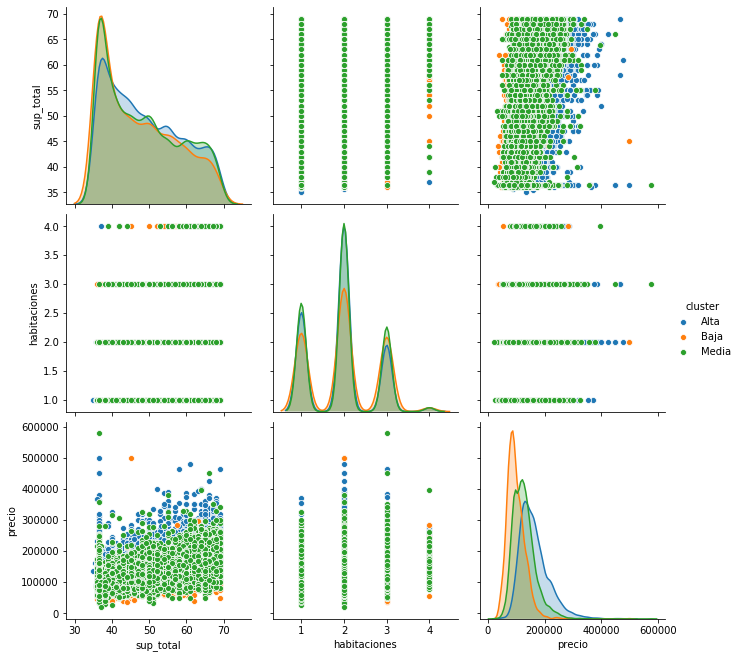

In [33]:
sns.pairplot(df_train, vars=['sup_total','habitaciones','precio'], hue='cluster', height=3)

# Pipeline preprocesamiento

In [49]:
# y_transformer = PowerTransformer()
y_transformer = QuantileTransformer(output_distribution='normal')

In [50]:
pipe = make_transformer_pipeline()
X_train_transformed = pipe.fit_transform(X_train).toarray()
y_train_transformed = y_transformer.fit_transform(y_train)

In [51]:
X_train_transformed, y_train_transformed

(array([[ 0.84540209,  0.95209473, -0.39275613, ...,  0.        ,
          0.        ,  0.        ],
        [ 0.49640854,  0.63657231, -0.39275613, ...,  0.        ,
          0.        ,  0.        ],
        [-1.45550193, -0.73194261, -0.39275613, ...,  0.        ,
          0.        ,  0.        ],
        ...,
        [ 1.13721597,  0.19559168, -0.39275613, ...,  0.        ,
          0.        ,  0.        ],
        [ 0.66476808,  0.33972116, -0.39275613, ...,  0.        ,
          0.        ,  0.        ],
        [ 0.53212571, -1.03902861, -0.39275613, ...,  0.        ,
          0.        ,  0.        ]]),
 array([[ 1.45327957],
        [ 1.41356782],
        [-0.40712168],
        ...,
        [ 2.74745331],
        [ 1.29608923],
        [-0.17273102]]))

(array([1.000e+00, 1.200e+01, 3.190e+02, 2.347e+03, 6.272e+03, 6.296e+03,
        2.330e+03, 3.330e+02, 1.000e+01, 1.000e+00]),
 array([-5.19933758e+00, -4.15947007e+00, -3.11960255e+00, -2.07973503e+00,
        -1.03986752e+00,  4.89217555e-11,  1.03986752e+00,  2.07973503e+00,
         3.11960255e+00,  4.15947007e+00,  5.19933758e+00]),
 <a list of 10 Patch objects>)

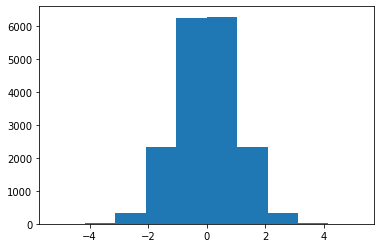

In [52]:
plt.hist(y_train_transformed)

# Modelo red densa Keras

In [58]:
EPOCHS = 1000
BATCH_SIZE = 64

# Callbacks #

# Parar entrenamiento cuando no mejora MSE
early_stop = keras.callbacks.EarlyStopping(monitor='val_root_mean_squared_error', patience=300, baseline=.5)

# Guardar modelo entrenado
checkpoint = keras.callbacks.ModelCheckpoint('modelo_prediccion_propiedades.hdf5', monitor='val_loss', verbose=0,
    save_best_only=True, mode='auto')

# Reducir learning rate cuando no mejora MSE
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=50, min_lr=0.0001)



# model = build_1layer_keras_model(X_train_transformed.shape[1], n_neurons=64) 
model = build_dense_keras_model(X_train_transformed.shape[1], n_neurons=[128]) 

model.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_14 (Dense)             (None, 128)               7296      
_________________________________________________________________
dense_15 (Dense)             (None, 1)                 129       
Total params: 7,425
Trainable params: 7,425
Non-trainable params: 0
_________________________________________________________________


In [59]:
history = model.fit(X_train_transformed, y_train_transformed, 
                    batch_size=BATCH_SIZE,
                    epochs=EPOCHS, 
                    validation_split = test_size, 
                    callbacks=[checkpoint, 
                               early_stop, 
                               reduce_lr, 
                               tfdocs.modeling.EpochDots()],
                    verbose=1)

rror: 0.4645 - val_loss: 0.3300 - val_root_mean_squared_error: 0.5744 - lr: 1.0000e-04
Epoch 199/1000
247/247 [==============================] - 0s 1ms/step - loss: 0.2156 - root_mean_squared_error: 0.4643 - val_loss: 0.3288 - val_root_mean_squared_error: 0.5734 - lr: 1.0000e-04
Epoch 200/1000
247/247 [==============================] - 0s 1ms/step - loss: 0.2156 - root_mean_squared_error: 0.4644 - val_loss: 0.3288 - val_root_mean_squared_error: 0.5734 - lr: 1.0000e-04
Epoch 201/1000
241/247 [============================>.] - ETA: 0s - loss: 0.2164 - root_mean_squared_error: 0.4651
Epoch: 200, loss:0.2156,  lr:0.0001,  root_mean_squared_error:0.4643,  val_loss:0.3286,  val_root_mean_squared_error:0.5733,  
247/247 [==============================] - 0s 1ms/step - loss: 0.2156 - root_mean_squared_error: 0.4643 - val_loss: 0.3286 - val_root_mean_squared_error: 0.5733 - lr: 1.0000e-04
Epoch 202/1000
247/247 [==============================] - 0s 2ms/step - loss: 0.2155 - root_mean_squared_er

Text(0, 0.5, 'RMSE [Precio]')

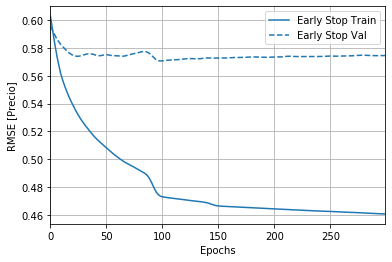

In [60]:
plotter = tfdocs.plots.HistoryPlotter(smoothing_std=2)

plotter.plot({'Early Stop': history}, metric = "root_mean_squared_error")
plt.ylabel('RMSE [Precio]')

(array([  1.,   1.,  45., 331., 839., 863., 319.,  43.,   1.,   1.]),
 array([-5.19933758e+00, -4.15947007e+00, -3.11960255e+00, -2.07973503e+00,
        -1.03986752e+00,  4.89217555e-11,  1.03986752e+00,  2.07973503e+00,
         3.11960255e+00,  4.15947007e+00,  5.19933758e+00]),
 <a list of 10 Patch objects>)

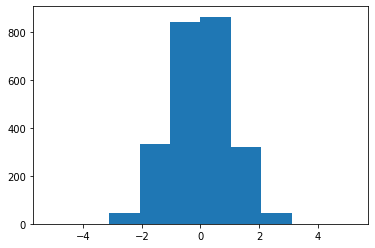

In [29]:
X_test_transformed = pipe.transform(X_test)
y_test_transformed = y_transformer.fit_transform(y_test)

plt.hist(y_test_transformed)

In [30]:
loss, rmse = model.evaluate(X_test_transformed, y_test_transformed, verbose=2)
# loss, rmse
rmse = y_transformer.inverse_transform(np.atleast_1d(rmse).reshape(-1,1))
rmse
# print("Testing set RMSE: {:5.2f}".format()

77/77 - 0s - loss: 0.3298 - root_mean_squared_error: 0.5743


array([[150956.75188025]])

In [31]:
y_pred = model.predict(X_test_transformed).flatten()
y_pred

array([-0.6992187 ,  0.37424308,  0.30967265, ..., -0.13104129,
       -0.2444331 ,  0.05149006], dtype=float32)

In [32]:
y_pred = y_transformer.inverse_transform(y_pred.reshape(-1,1))
y_pred

array([[100000.  ],
       [144767.94],
       [140000.  ],
       ...,
       [123273.05],
       [119000.  ],
       [129000.  ]], dtype=float32)

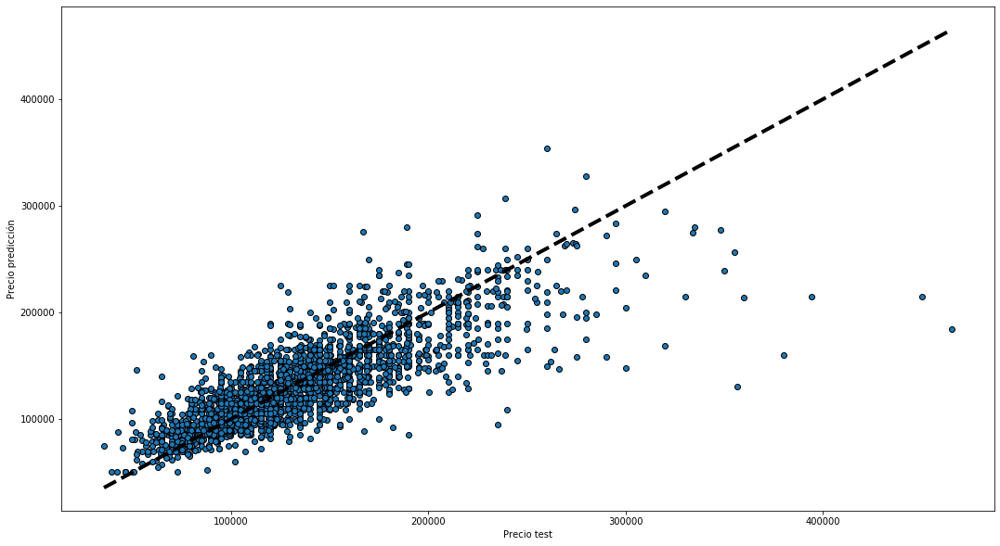

In [33]:
plot_test_predictions(y_test, y_pred)

# Preprocesamiento set de test

In [5]:
df_test = read_rds('data_test_def.rds')
df_test.head()

,id,lat,lon,precio,BARRIO,n_uni,n_boliches,n_clinicas,n_hospitales,sup_cubierta,...,dormitorios,n_robo_vehi,p_mt2,lujo,sup_total,habitaciones,descripcion,subbarrio,terraza,Cluster
0,2,-34.586330,-58.508957,NaN,villa pueyrredon,1,1,0,0,37.0,...,1.0,3,2842.666667,0.0,45.0,1.0,Impecable 2 ambientes con patio cubierto con t...,NaN,1.0,Media
1,34,-34.581699,-58.433547,NaN,palermo,3,24,1,0,40.0,...,1.0,2,3518.250000,0.0,53.0,1.0,Monoambiente impecable divisible a dos ambient...,Palermo Hollywood,0.0,Alta
2,54,-34.628187,-58.429586,NaN,parque chacabuco,0,1,1,1,38.0,...,1.0,20,2745.000000,1.0,42.0,2.0,Palmera Caballito: Torre con amenities de gran...,NaN,0.0,Media
3,101,-34.593716,-58.440695,NaN,villa crespo,0,15,0,0,38.0,...,1.0,1,2669.000000,0.0,62.0,2.0,Corredor Responsable: Ariel Champanier - CUCIC...,NaN,1.0,Media
4,103,-34.591336,-58.447218,NaN,chacarita,0,8,0,0,40.0,...,1.0,0,2811.333333,1.0,44.0,2.0,Departamento de 2 ambientes con cochera ubicad...,NaN,0.0,Alta


In [7]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2500 entries, 0 to 2499
Data columns (total 34 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              2500 non-null   object 
 1   lat             2500 non-null   float64
 2   lon             2500 non-null   float64
 3   precio          0 non-null      object 
 4   BARRIO          2500 non-null   object 
 5   n_uni           2500 non-null   int32  
 6   n_boliches      2500 non-null   int32  
 7   n_clinicas      2500 non-null   int32  
 8   n_hospitales    2500 non-null   int32  
 9   sup_cubierta    2500 non-null   float64
 10  n_comisarias    2500 non-null   int32  
 11  n_embajadas     2500 non-null   int32  
 12  n_subte_bocas   2500 non-null   int32  
 13  n_barrios_p     2500 non-null   int32  
 14  n_bici          2500 non-null   int32  
 15  n_bancos        2500 non-null   int32  
 16  A_Estrenar      2500 non-null   float64
 17  banios          2500 non-null   f

In [360]:
ids, df_test = preprocessing(df_test, process_outliers=False)

In [361]:
df_test.head()

,lat,lon,sup_total,habitaciones,cluster,balcon,cochera,parrilla,pileta,sum
id,,,,,,,,,,
2,-34.586330,-58.508957,45.0,1.0,Media,0,0,0,0,0
34,-34.581699,-58.433547,53.0,1.0,Alta,1,1,0,0,0
54,-34.628187,-58.429586,42.0,2.0,Baja,1,0,1,0,0
101,-34.593716,-58.440695,62.0,2.0,Media,1,0,0,0,0
103,-34.591336,-58.447218,44.0,2.0,Media,1,1,0,0,0


In [ ]:
df_test.drop(['precio'], axis=1, inplace=True)
df_test.head()

# Predicción con red neuronal

In [ ]:
X = pipe.transform(df_test)
X.shape

In [ ]:
y_pred = model.predict(X).flatten()
data = pd.DataFrame(data={'id' : ids.values, 'precio': np.round(y_pred).astype(int) })
data

In [ ]:
data.to_csv('propiedades_prediccion.csv', index=False)